In [2]:
from maxpy.utils import *
from maxpy.algorithms import *
import matplotlib.pyplot as plt
import cmasher
#plt.style.use("dark")
cmap = plt.get_cmap("cmr.lavender")

# Magnetic Reconnection Toy Model via Vector Potential
## $B$ at $t=t_{end}$

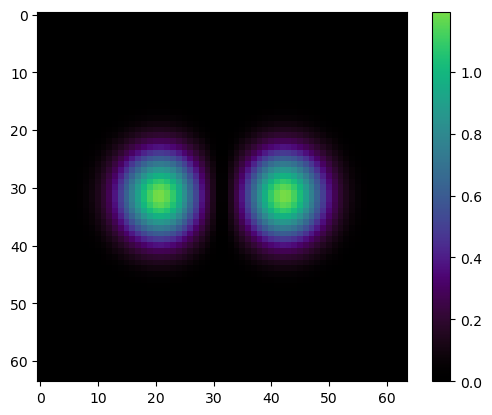

In [3]:
size = 64
lin = np.linspace(-4, 4, size)
X, Y, Z = np.meshgrid(lin, lin, lin, indexing="ij")

A = (np.exp(-((X-1)**2 + Y**2 )) + np.exp(-((X+1)**2 + Y**2)))*np.abs(X)

B_final = curl(lin, lin, lin, np.zeros(A.shape), np.zeros(A.shape), A)

B_final[2] = 1

#save_as_vti(B_final, "../../Data/VTK/", "critical_line")
plt.imshow(A[:,:,size//2].T, cmap=cmap)
plt.colorbar()

## $B$ at $t=t_0$

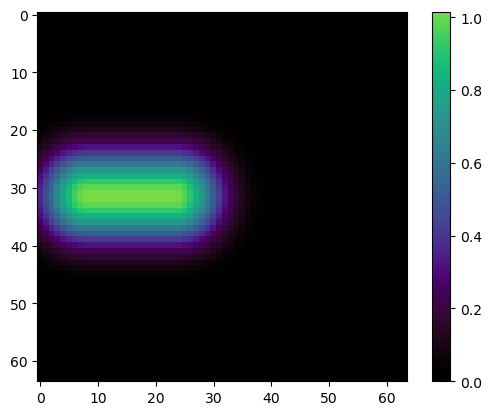

In [4]:
linx = np.linspace(-2, 6, size)
liny = np.linspace(-4, 4, size)
X, Y = np.meshgrid(linx, liny, indexing="ij")

A = (np.exp(-((X-1)**2 + Y**2 )) + np.exp(-((X+1)**2 + Y**2))) 

idx1 = np.abs(linx + 1).argmin()
idx2 = np.abs(linx - 1).argmin()

A[idx1:idx2] = A[idx1]

plt.imshow(A.T, cmap=cmap)
plt.colorbar()

In [5]:
# make 3D by repeating n times
A = np.array([A for i in range(size)])

# Add noise
A += np.random.normal(0,0.01,A.shape)

# Get curl of vector potential
B_init = curl(lin, lin, lin, np.zeros(A.shape), np.zeros(A.shape), A.transpose(1,2,0))

# Add non-zero z component
B_init[2] = 0

#save_as_vti(B_init, "../../Data/VTK/", "critical_line_init")

In [6]:
intp_steps = np.linspace(0,4,size)

def get_init(i):
    linx = np.linspace(-intp_steps[i], 4-intp_steps[i], size)
    liny = np.linspace(-2, 2, size)
    X, Y = np.meshgrid(linx, liny, indexing="ij")

    A = (np.exp(-((X-1)**2 + Y**2 )) + np.exp(-((X+1)**2 + Y**2))) 

    idx1 = np.abs(linx + 1).argmin()
    idx2 = np.abs(linx - 1).argmin()

    A[idx1:idx2] = A[idx1]

    # plt.imshow(A.T, cmap=cmap)
    # plt.colorbar()
    # plt.show()

    # make 3D by repeating n times
    A = np.array([A for i in range(size)])

    # Add noise
    #A += np.random.normal(0,0.01,A.shape)

    # Get curl of vector potential
    B_init = curl(lin, lin, lin, np.zeros(A.shape), np.zeros(A.shape), A.transpose(1,2,0))

    # Add non-zero z component
    B_init[2] += 1
    return B_init

def get_final(i):
    size = 64
    lin = np.linspace(-2, 2, size)
    linx = np.linspace(-intp_steps[i], 4-intp_steps[i], size)
    X, Y, _ = np.meshgrid(linx, lin, lin, indexing="ij")

    A = (np.exp(-((X-1)**2 + Y**2 )) + np.exp(-((X+1)**2 + Y**2)))*np.abs(X)

    B_final = curl(lin, lin, lin, np.zeros(A.shape), np.zeros(A.shape), A)

    B_final[2] += 1

    #save_as_vti(B_final, "../../Data/VTK/", "critical_line")
    # plt.imshow(A[:,:,size//2].T, cmap=cmap)
    # plt.colorbar()
    # plt.show()
    return B_final

steps = size
save = True
name = "output"
time_tensor = np.zeros((steps,*(B_init.shape)))
start = np.array([0,-0.5,0])
end = np.array([0,0.5,0])
for i in tqdm.tqdm(range(steps)):
    time_tensor[i] = (1-i/(steps-1))*get_init(i) + i/(steps-1)*get_final(i)
    Jac = get_jacobian(time_tensor[i], lin, lin, lin)

    flow_reshaped = time_tensor[i].reshape(time_tensor[i].shape[0], -1)  
    Jac_reshaped = Jac.reshape(Jac.shape[0], Jac.shape[1], -1)  

    Jv = np.einsum("ijk,jk->ik", Jac_reshaped, flow_reshaped)

    #l2 = get_shear_layer(time_tensor[i], Jac, lin, lin , lin)

    if save:
        save_as_vti(time_tensor[i], Jv.reshape(3,size,size,size), origin=(-4,-4,-4), spacing=(lin[1]-lin[0],lin[1]-lin[0],lin[1]-lin[0]), savepath="/home/max/Temp/", name=f"{name}{i}")
        #save_as_vti(l2, Jv.reshape(3,size,size,size), origin=(-4,-4,-4), spacing=(lin[1]-lin[0],lin[1]-lin[0],lin[1]-lin[0]), savepath="/home/max/Temp/", name=f"l2{name}{i}")


  0%|          | 0/64 [00:00<?, ?it/s]

orign/spacing -4 -4 -4


  2%|▏         | 1/64 [00:00<00:37,  1.67it/s]

orign/spacing -4 -4 -4


  3%|▎         | 2/64 [00:01<00:44,  1.40it/s]

orign/spacing -4 -4 -4


  5%|▍         | 3/64 [00:02<00:42,  1.43it/s]

orign/spacing -4 -4 -4


  6%|▋         | 4/64 [00:02<00:40,  1.47it/s]

orign/spacing -4 -4 -4


  8%|▊         | 5/64 [00:03<00:39,  1.49it/s]

orign/spacing -4 -4 -4


  9%|▉         | 6/64 [00:04<00:38,  1.51it/s]

orign/spacing -4 -4 -4


 11%|█         | 7/64 [00:04<00:37,  1.52it/s]

orign/spacing -4 -4 -4


 12%|█▎        | 8/64 [00:05<00:39,  1.43it/s]

orign/spacing -4 -4 -4


 14%|█▍        | 9/64 [00:06<00:37,  1.47it/s]

orign/spacing -4 -4 -4


 16%|█▌        | 10/64 [00:06<00:35,  1.51it/s]

orign/spacing -4 -4 -4


 17%|█▋        | 11/64 [00:07<00:34,  1.54it/s]

orign/spacing -4 -4 -4


 19%|█▉        | 12/64 [00:07<00:33,  1.55it/s]

orign/spacing -4 -4 -4


 20%|██        | 13/64 [00:08<00:32,  1.57it/s]

orign/spacing -4 -4 -4


 22%|██▏       | 14/64 [00:09<00:31,  1.60it/s]

orign/spacing -4 -4 -4


 23%|██▎       | 15/64 [00:09<00:30,  1.61it/s]

orign/spacing -4 -4 -4


 25%|██▌       | 16/64 [00:10<00:29,  1.64it/s]

orign/spacing -4 -4 -4


 27%|██▋       | 17/64 [00:11<00:28,  1.63it/s]

orign/spacing -4 -4 -4


 28%|██▊       | 18/64 [00:11<00:27,  1.65it/s]

orign/spacing -4 -4 -4


 30%|██▉       | 19/64 [00:12<00:27,  1.62it/s]

orign/spacing -4 -4 -4


 31%|███▏      | 20/64 [00:12<00:26,  1.65it/s]

orign/spacing -4 -4 -4


 33%|███▎      | 21/64 [00:13<00:25,  1.66it/s]

orign/spacing -4 -4 -4


 34%|███▍      | 22/64 [00:14<00:25,  1.66it/s]

orign/spacing -4 -4 -4


 36%|███▌      | 23/64 [00:14<00:24,  1.68it/s]

orign/spacing -4 -4 -4


 38%|███▊      | 24/64 [00:15<00:23,  1.69it/s]

orign/spacing -4 -4 -4


 39%|███▉      | 25/64 [00:15<00:23,  1.69it/s]

orign/spacing -4 -4 -4


 41%|████      | 26/64 [00:16<00:22,  1.67it/s]

orign/spacing -4 -4 -4


 42%|████▏     | 27/64 [00:16<00:22,  1.68it/s]

orign/spacing -4 -4 -4


 44%|████▍     | 28/64 [00:17<00:21,  1.68it/s]

orign/spacing -4 -4 -4


 45%|████▌     | 29/64 [00:18<00:20,  1.68it/s]

orign/spacing -4 -4 -4


 47%|████▋     | 30/64 [00:18<00:20,  1.68it/s]

orign/spacing -4 -4 -4


 48%|████▊     | 31/64 [00:19<00:19,  1.65it/s]

orign/spacing -4 -4 -4


 50%|█████     | 32/64 [00:19<00:19,  1.65it/s]

orign/spacing -4 -4 -4


 52%|█████▏    | 33/64 [00:20<00:18,  1.66it/s]

orign/spacing -4 -4 -4


 53%|█████▎    | 34/64 [00:21<00:17,  1.69it/s]

orign/spacing -4 -4 -4


 55%|█████▍    | 35/64 [00:21<00:17,  1.69it/s]

orign/spacing -4 -4 -4


 56%|█████▋    | 36/64 [00:22<00:16,  1.68it/s]

orign/spacing -4 -4 -4


 58%|█████▊    | 37/64 [00:22<00:16,  1.67it/s]

orign/spacing -4 -4 -4


 59%|█████▉    | 38/64 [00:23<00:15,  1.68it/s]

orign/spacing -4 -4 -4


 61%|██████    | 39/64 [00:24<00:15,  1.67it/s]

orign/spacing -4 -4 -4


 62%|██████▎   | 40/64 [00:24<00:14,  1.67it/s]

orign/spacing -4 -4 -4


 64%|██████▍   | 41/64 [00:25<00:13,  1.67it/s]

orign/spacing -4 -4 -4


 66%|██████▌   | 42/64 [00:25<00:13,  1.67it/s]

orign/spacing -4 -4 -4


 67%|██████▋   | 43/64 [00:26<00:12,  1.66it/s]

orign/spacing -4 -4 -4


 69%|██████▉   | 44/64 [00:27<00:12,  1.65it/s]

orign/spacing -4 -4 -4


 70%|███████   | 45/64 [00:27<00:11,  1.61it/s]

orign/spacing -4 -4 -4


 72%|███████▏  | 46/64 [00:28<00:11,  1.59it/s]

orign/spacing -4 -4 -4


 73%|███████▎  | 47/64 [00:29<00:10,  1.61it/s]

orign/spacing -4 -4 -4


 75%|███████▌  | 48/64 [00:29<00:09,  1.61it/s]

orign/spacing -4 -4 -4


 77%|███████▋  | 49/64 [00:30<00:09,  1.60it/s]

orign/spacing -4 -4 -4


 78%|███████▊  | 50/64 [00:31<00:09,  1.55it/s]

orign/spacing -4 -4 -4


 80%|███████▉  | 51/64 [00:31<00:08,  1.53it/s]

orign/spacing -4 -4 -4


 81%|████████▏ | 52/64 [00:32<00:07,  1.55it/s]

orign/spacing -4 -4 -4


 83%|████████▎ | 53/64 [00:32<00:06,  1.57it/s]

orign/spacing -4 -4 -4


 84%|████████▍ | 54/64 [00:33<00:06,  1.58it/s]

orign/spacing -4 -4 -4


 86%|████████▌ | 55/64 [00:34<00:05,  1.58it/s]

orign/spacing -4 -4 -4


 88%|████████▊ | 56/64 [00:34<00:05,  1.57it/s]

orign/spacing -4 -4 -4


 89%|████████▉ | 57/64 [00:35<00:04,  1.57it/s]

orign/spacing -4 -4 -4


 91%|█████████ | 58/64 [00:36<00:03,  1.57it/s]

orign/spacing -4 -4 -4


 92%|█████████▏| 59/64 [00:36<00:03,  1.55it/s]

orign/spacing -4 -4 -4


 94%|█████████▍| 60/64 [00:37<00:02,  1.53it/s]

orign/spacing -4 -4 -4


 95%|█████████▌| 61/64 [00:38<00:02,  1.47it/s]

orign/spacing -4 -4 -4


 97%|█████████▋| 62/64 [00:38<00:01,  1.45it/s]

orign/spacing -4 -4 -4


 98%|█████████▊| 63/64 [00:39<00:00,  1.43it/s]

orign/spacing -4 -4 -4


100%|██████████| 64/64 [00:40<00:00,  1.59it/s]


## Linear Interpolation between $B_0$ and $B_{end}$

In [18]:
def lerp(field1, field2, steps = 100, save = False, name = "output"):
    """Linear interpolation of two fields

    Args:
        field1 (Field): Initial field
        field2 (Field): Final field
        steps (int, optional): Number of steps linear interpolation should be evaluated on. Defaults to 100.

    Returns:
        np.array: N+1 dimensional tensor containing all time steps
    """
    time_tensor = np.zeros((steps,*(field1.shape)))
    start = np.array([0,-0.5,0])
    end = np.array([0,0.5,0])
    for i in tqdm.tqdm(range(steps)):
        tmp = (1-i/(steps-1))*field1 + i/(steps-1)*field2
        translate = (1-i/(steps-1))*start + i/(steps-1)*end
        time_tensor[i] = tmp + translate[:,np.newaxis, np.newaxis, np.newaxis]
        if save:
            save_as_vti(time_tensor[i], "/home/max/Temp/", f"{name}{i}")
    return time_tensor

In [19]:
timesteps = size
time_tensor = lerp(B_init, B_final, steps=timesteps, save=True)

100%|██████████| 64/64 [00:06<00:00,  9.51it/s]


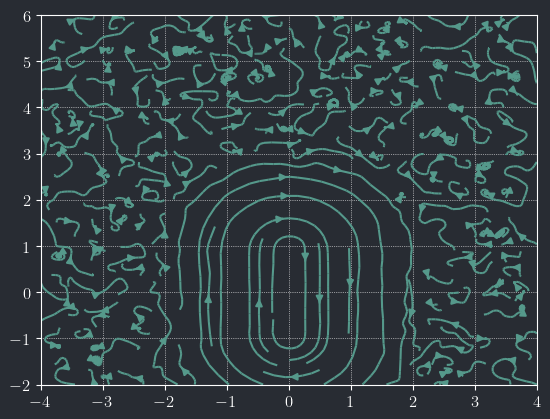

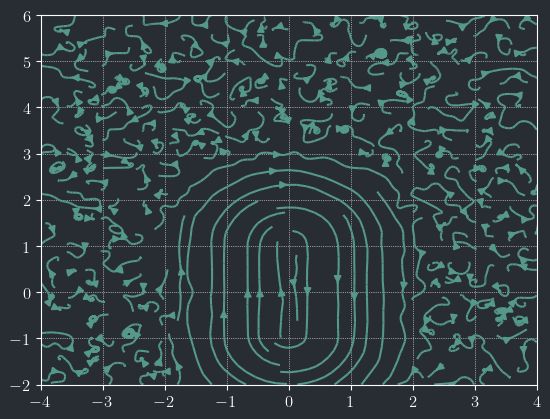

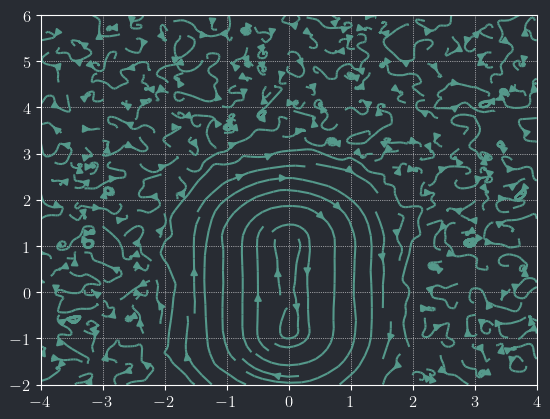

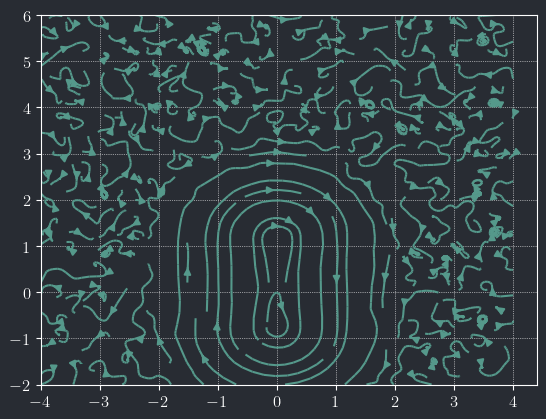

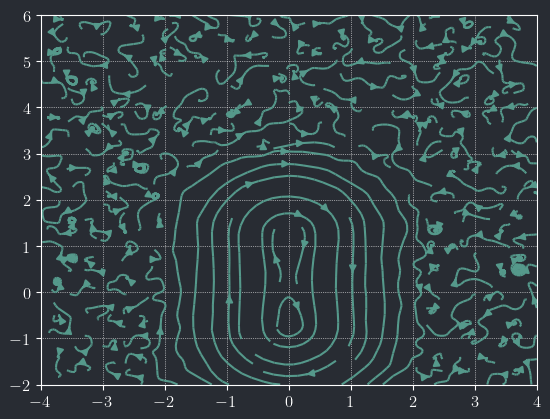

...

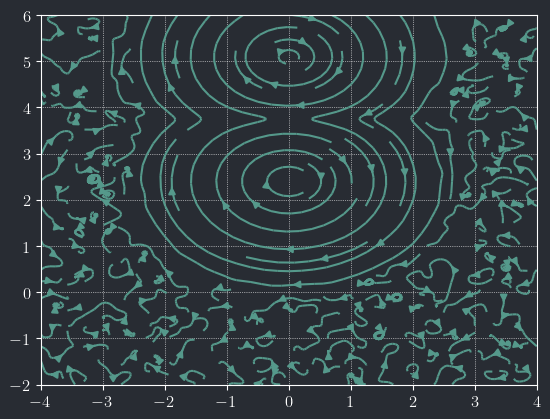

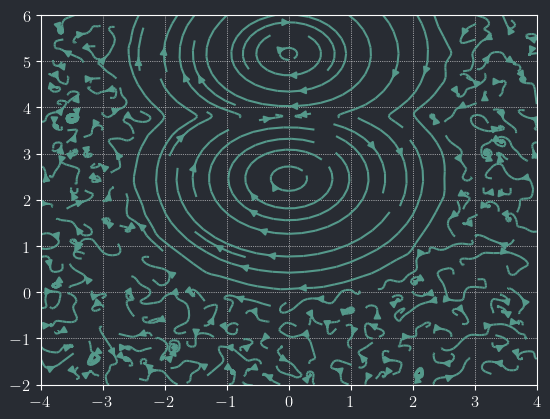

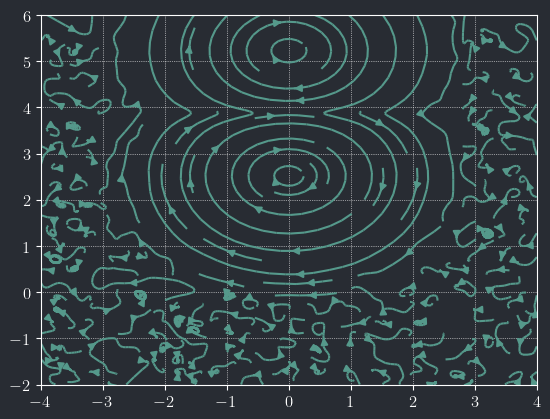

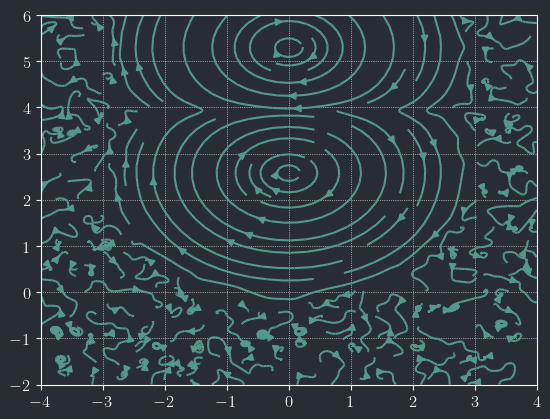

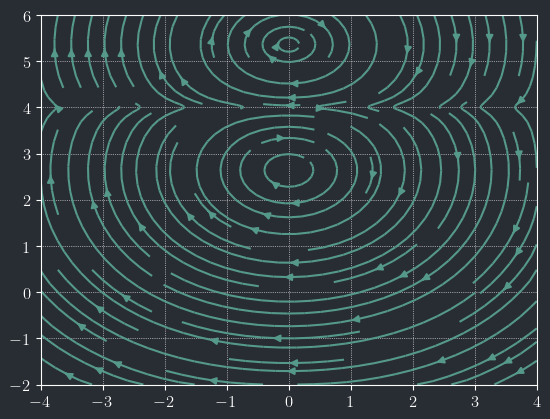

In [67]:
for i in range(size):
    plt.streamplot(Y, X, time_tensor[i][1,:,:,0], time_tensor[i][0,:,:,0])
    plt.show()

# Calculate Bifurcation line

In [24]:
def get_parallel_vector_operator(vec, x, y, z):
    sizex, sizey, sizez = vec.shape[1], vec.shape[2], vec.shape[3]

    Jac = get_jacobian(vec, x, y, z)
    
    # Reshape vec for vectorized operations
    vec_reshaped = vec.reshape(vec.shape[0], -1)  
    Jac_reshaped = Jac.reshape(Jac.shape[0], Jac.shape[1], -1)  

    Jv = np.einsum("ijk,jk->ik", Jac_reshaped, vec_reshaped)

    cross_product = np.cross(vec_reshaped.T, Jv.T)
    parallel = np.linalg.norm(cross_product, axis=1)

    eigvals = np.linalg.eigvals(Jac_reshaped.transpose(2,0,1))

    filter = np.abs(np.sum(np.abs(np.imag(eigvals)), axis=1)) == 0

    parallel[~filter] = 2 * parallel.max() 
    return parallel.reshape(sizex, sizey, sizez)

import scipy.ndimage as ndimage


for i in tqdm.tqdm(range(size)):
    result = get_parallel_vector_operator(time_tensor[i], lin, lin, lin)#*1e6
    #result = ndimage.gaussian_filter(result, sigma=(5, 5, 5), order=0)
    save_as_vti(result, "/home/max/Temp/", f"potential3d_parallel_vector{str(i).zfill(3)}")

100%|██████████| 64/64 [00:05<00:00, 12.75it/s]


# Make unstructured grid for ridge extraction

(64, 64, 64) (64, 64, 64) (64, 64, 64) (64, 64, 64)


/home/max/miniconda3/envs/work/lib/python3.11/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

Your build of VTK does not have the proper web modules enabled.
These modules are typically enabled by default with the
`-DVTK_GROUP_ENABLE_Web:STRING=WANT` build flag.

Conda users: This is a known issue with the conda-forge VTK feedstock.
See https://github.com/conda-forge/vtk-feedstock/pull/258


Falling back to a static output.
  warnings.warn(


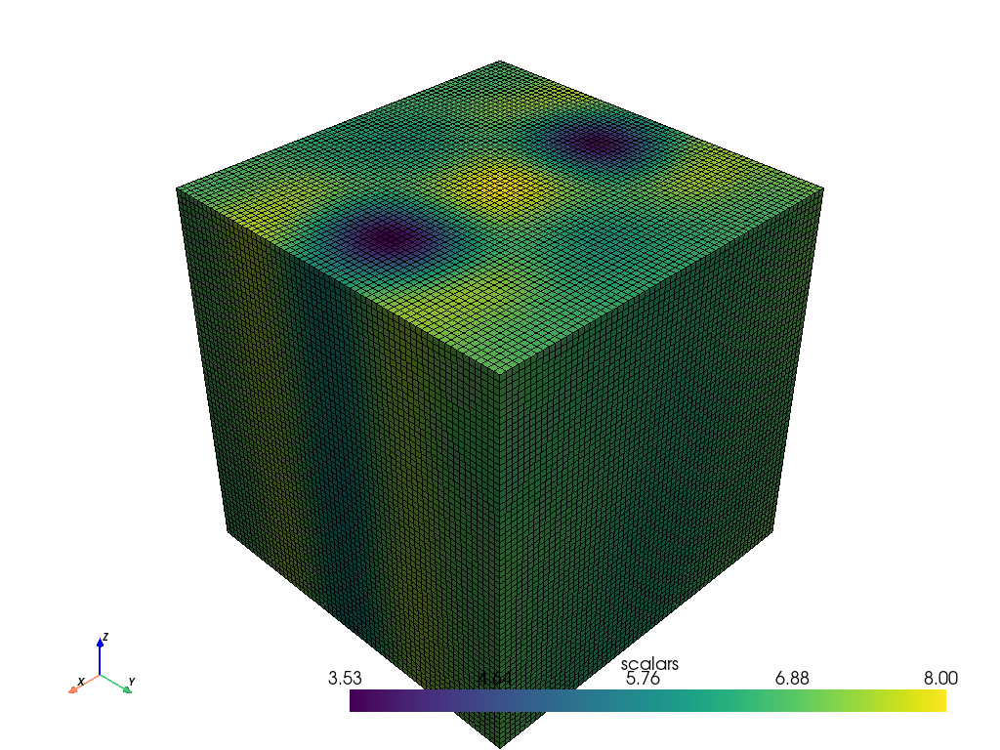

UnstructuredGrid (0x7f0e29dafc40)
  N Cells:    250047
  N Points:   262144
  X Bounds:   -2.000e+00, 2.000e+00
  Y Bounds:   -2.000e+00, 2.000e+00
  Z Bounds:   -2.000e+00, 2.000e+00
  N Arrays:   1

In [7]:
X, Y, Z = np.meshgrid(lin, lin, lin, indexing="ij")
print(result.shape, X.shape, Y.shape, Z.shape)

numpyToVtkUnstructuredGrid(result, X, Y, Z, True, True, "../../Data/VTK", "potential3d_parallel_vector")

In [19]:
size = 64
lin = np.linspace(-2,2,size)
X,Y,Z = np.meshgrid(lin, lin, lin)

flow = time_tensor[size//2].copy()
print(B_final.shape)

result = np.zeros((size,size,size))

Jac = get_jacobian(flow, lin, lin, lin)

for i in range(size):
    for j in range(size):
        for k in range(size):
            #Jac = get_jacobian(flow[:,i,j,k], lin, lin, lin)
            result[i,j,k] = np.linalg.norm(np.cross(flow[:,i,j,k], Jac[:,:,i,j,k]@flow[:,i,j,k]))
            
result = get_parallel_vector_operator(flow, lin, lin, lin)

(3, 64, 64, 64)


In [38]:
#result = get_parallel_vector_operator(flow, lin, lin, lin)
# Reshape vec for vectorized operations
flow_reshaped = flow.reshape(flow.shape[0], -1)  
Jac_reshaped = Jac.reshape(Jac.shape[0], Jac.shape[1], -1)  

Jv = np.einsum("ijk,jk->ik", Jac_reshaped, flow_reshaped)
print(Jv.shape)


save_as_vti(flow, Jv.reshape(3,size,size,size), "../../Data/VTK/", "flow_test")

(3, 262144)
True


In [12]:
def save_as_vti(dset, grad, savepath="./", name="output"):
    """Save numpy 3d data array as vtkImageData for visualization in Paraview

    Args:
        dset (np.ndarray): Data array containing the scalar or vector values
        savepath (str, optional): Path where to save the .vti file. Defaults to "./".
        name (str, optional): Name of the file and dataset. Defaults to "output".

    Raises:
        NotImplementedError: Only 3D scalar or vector fields are supported right now
    """
    # Create a PyVista grid object
    if len(dset.shape) == 4:
        print(dset.shape == grad.shape)
        # If vector field
        dset = dset.transpose(1,2,3,0)
        dset_flat = np.array([dset[:,:,:,i].flatten(order="F") for i in range(3)]).T

        grad = grad.transpose(1,2,3,0)
        grad_flat = np.array([grad[:,:,:,i].flatten(order="F") for i in range(3)]).T

        grid = pv.ImageData(dimensions=dset.shape)
        grid.point_data.set_vectors(dset_flat, "vectors")
        grid.point_data.set_vectors(grad_flat, "Jac")
    elif len(dset.shape) == 3:
        # If scalar field
        grid = pv.ImageData(dimensions=dset.shape)
        grid.point_data.set_scalars(dset.flatten(order="F"), "field")
    else:
        raise NotImplementedError()
    
    # Write the VTK file
    grid.save(savepath + name + ".vti")